In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('datos.csv', sep='|', on_bad_lines='skip', parse_dates=['datetime'], index_col='datetime')
df.head()

,K-1303_Engine_RPM,K-1303_Engine_Load_Factor,K-1303_Fuel_Gas_Pressure,K-1303_Pre_Catalyst_Temperature,K-1303_Post_Catalyst_Temperature,K-1303_Actual_Engine_Timing,K-1303_Inlet_Air_Temperature,K-1303_Fuel_Pressure_-_Absolute,K-1303_Engine_Fuel_Gas_Temperature,K-1303_Fuel_Valve_Position,...,K-1303_Suction_Screen_Differential_Pressure,K-1303_Stage_#1_Suction_Temperature,K-1303_Cylinder_#1_Temperature,K-1303_Stage_#2_Suction_Temperature,K-1303_Cylinder_#2_Temperature,K-1303_Stage_#3_Suction_Temperature,K-1303_Cylinder_#3_Temperature,K-1303_Cylinder_#4_Temperature,Train_1_Inlet_Separator_Pressure,Train_1_Sales_Pressure
datetime,,,,,,,,,,,,,,,,,,,,,
2018-08-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,111.0,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,111.0,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-01 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,111.0,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,111.0,NaN,NaN,NaN,NaN,NaN,NaN
2018-08-01 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,111.0,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
train = df.loc['2019-09-05':'2020-09-04']

In [4]:
test = df.loc['2018-08-01':'2019-04-01']

# Exploratory Data Analysis

In [5]:
train.shape

(8761, 59)

In [6]:
train.describe()

,K-1303_Engine_RPM,K-1303_Engine_Load_Factor,K-1303_Fuel_Gas_Pressure,K-1303_Pre_Catalyst_Temperature,K-1303_Post_Catalyst_Temperature,K-1303_Actual_Engine_Timing,K-1303_Inlet_Air_Temperature,K-1303_Fuel_Pressure_-_Absolute,K-1303_Engine_Fuel_Gas_Temperature,K-1303_Fuel_Valve_Position,...,K-1303_Suction_Screen_Differential_Pressure,K-1303_Stage_#1_Suction_Temperature,K-1303_Cylinder_#1_Temperature,K-1303_Stage_#2_Suction_Temperature,K-1303_Cylinder_#2_Temperature,K-1303_Stage_#3_Suction_Temperature,K-1303_Cylinder_#3_Temperature,K-1303_Cylinder_#4_Temperature,Train_1_Inlet_Separator_Pressure,Train_1_Sales_Pressure
count,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,...,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,8502.000000,8265.000000,305.000000
mean,1299.227241,75.513879,31.124053,883.274524,799.272171,26.195672,148.332322,16.783630,68.450317,38.237356,...,0.291955,52.224535,163.329687,94.034933,214.662080,92.936250,164.260997,219.615973,129.238445,1166.633326
std,229.455218,14.010608,1.480983,166.183255,154.248624,3.488657,9.827804,0.754351,16.884333,6.322016,...,0.547051,9.227460,27.169063,10.776066,44.424512,19.951834,16.237698,42.286336,7.124415,15.997491
min,0.000000,0.000000,27.299999,63.000000,0.000000,0.000000,61.520000,13.561050,35.599998,0.000000,...,0.000000,19.000000,0.000000,53.000000,-102.000000,0.000000,57.000000,0.000000,0.559280,1057.113037
25%,1256.500000,71.000000,30.299999,915.000000,831.000000,23.000000,143.240005,16.896931,57.200001,39.000000,...,0.100000,44.000000,162.000000,87.000000,216.000000,82.000000,160.000000,219.000000,127.166199,1167.349976
50%,1371.000000,80.000000,30.900000,921.000000,836.000000,27.299999,147.559998,16.969450,64.400002,40.000000,...,0.200000,52.000000,165.000000,93.000000,227.000000,93.000000,163.000000,229.000000,128.378296,1170.441040
75%,1395.000000,84.000000,31.600000,927.000000,843.000000,29.100000,152.240005,17.041969,77.000000,41.000000,...,0.200000,60.000000,176.000000,101.000000,237.000000,107.000000,174.000000,238.000000,129.973206,1173.150024
max,1430.000000,95.000000,38.299999,1043.000000,891.000000,29.700001,200.000000,17.332041,149.000000,100.000000,...,8.500000,92.000000,192.000000,128.000000,261.000000,138.000000,195.000000,268.000000,298.199799,1176.859985


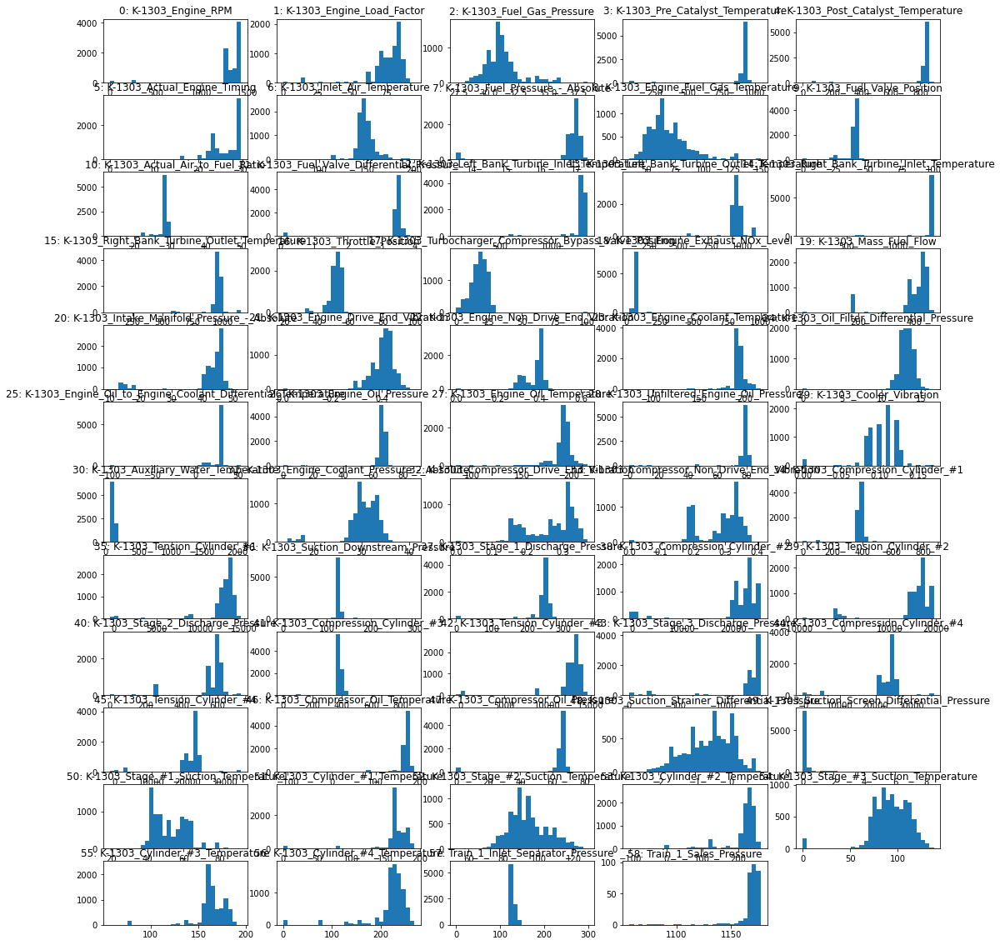

In [7]:
fig, axes = plt.subplots(12, 5, figsize=(18, 20))
for i, ax in enumerate(axes.ravel()):
    if i > 58:
        ax.set_visible(False)
        continue
    ax.hist(train.iloc[:, i], bins=30)
    ax.set_title("{}: {}".format(i, train.columns[i]))

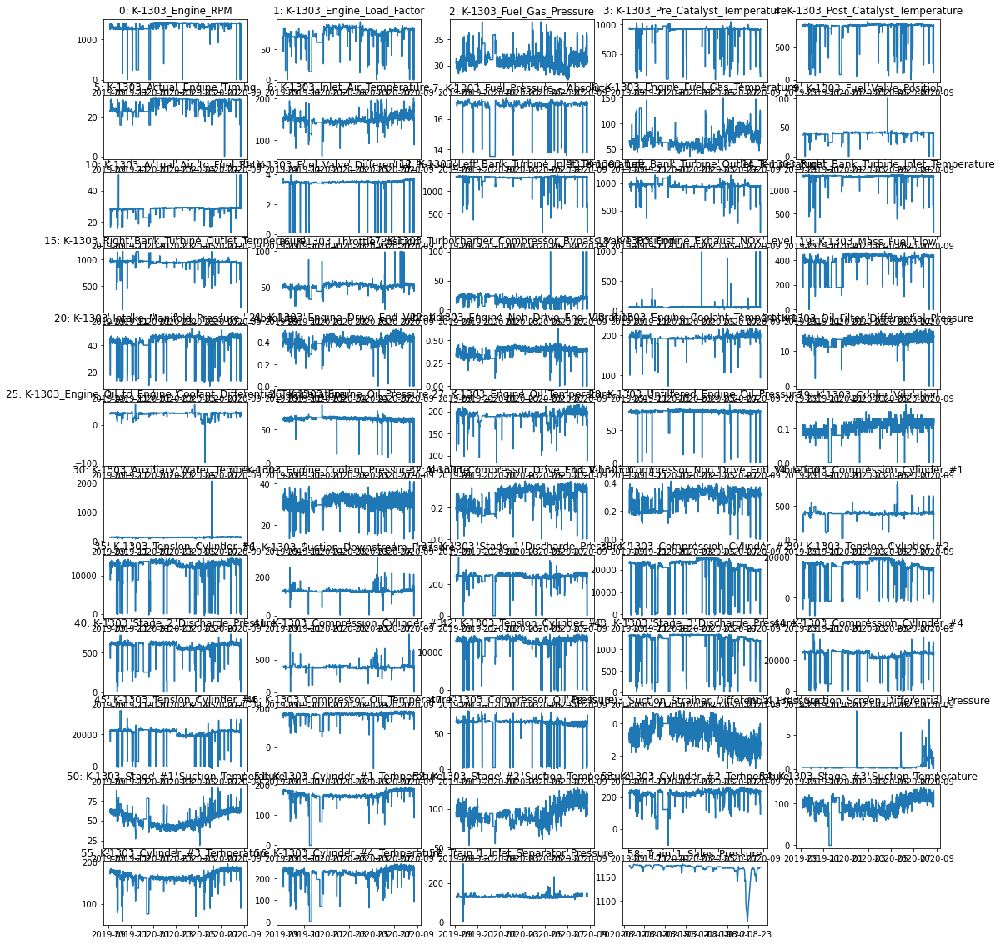

In [8]:
fig, axes = plt.subplots(12, 5, figsize=(18, 20))
for i, ax in enumerate(axes.ravel()):
    if i > 58:
        ax.set_visible(False)
        continue
    ax.plot(train.iloc[:, i])
    ax.set_title("{}: {}".format(i, train.columns[i]))

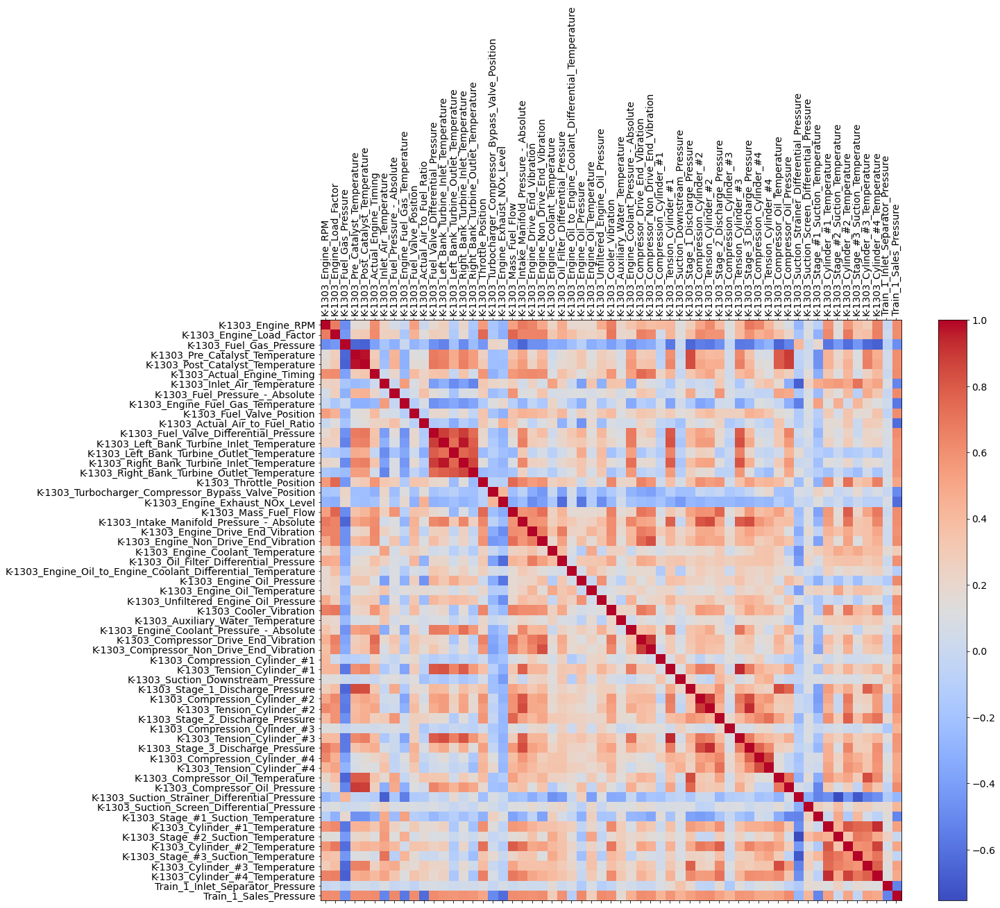

In [9]:
f = plt.figure(figsize=(19, 15))
plt.matshow(train.corr(), fignum=f.number, cmap=plt.cm.coolwarm)
plt.xticks(range(train.shape[1]), train.columns, fontsize=14, rotation=90)
plt.yticks(range(train.shape[1]), train.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

# Motor and Compressor's variables

In [10]:
motor = train[['K-1303_Engine_RPM',
'K-1303_Engine_Drive_End_Vibration',
'K-1303_Engine_Non_Drive_End_Vibration',
'K-1303_Engine_Load_Factor',
'K-1303_Engine_Coolant_Temperature',
'K-1303_Oil_Filter_Differential_Pressure',
'K-1303_Engine_Oil_to_Engine_Coolant_Differential_Temperature',
'K-1303_Engine_Oil_Pressure',
'K-1303_Engine_Oil_Temperature',
'K-1303_Inlet_Air_Temperature',
'K-1303_Unfiltered_Engine_Oil_Pressure',
'K-1303_Intake_Manifold_Pressure_-_Absolute',
'K-1303_Cooler_Vibration',
'K-1303_Auxiliary_Water_Temperature',
'K-1303_Engine_Coolant_Pressure_-_Absolute']]

In [11]:
compressor = train[['K-1303_Engine_RPM',
'K-1303_Engine_Load_Factor',
'K-1303_Compressor_Drive_End_Vibration',
'K-1303_Compressor_Non_Drive_End_Vibration',
'K-1303_Compression_Cylinder_#1',
'K-1303_Tension_Cylinder_#1',
'K-1303_Suction_Downstream_Pressure',
'K-1303_Stage_1_Discharge_Pressure',
'K-1303_Compression_Cylinder_#2',
'K-1303_Tension_Cylinder_#2',
'K-1303_Stage_2_Discharge_Pressure',
'K-1303_Compression_Cylinder_#3',
'K-1303_Tension_Cylinder_#3',
'K-1303_Stage_3_Discharge_Pressure',
'K-1303_Compression_Cylinder_#4',
'K-1303_Tension_Cylinder_#4',
'K-1303_Compressor_Oil_Temperature',
'K-1303_Compressor_Oil_Pressure',
'K-1303_Inlet_Air_Temperature',
'K-1303_Auxiliary_Water_Temperature']]

In [12]:
motor.shape

(8761, 15)

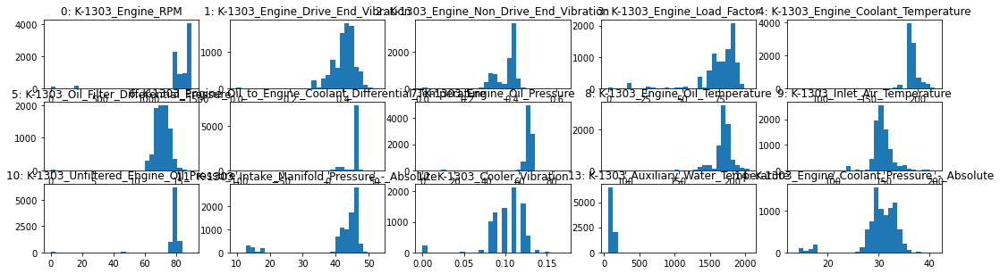

In [13]:
fig, axes = plt.subplots(12, 5, figsize=(18, 20))
for i, ax in enumerate(axes.ravel()):
    if i > 14:
        ax.set_visible(False)
        continue
    ax.hist(motor.iloc[:, i], bins=30)
    ax.set_title("{}: {}".format(i, motor.columns[i]))

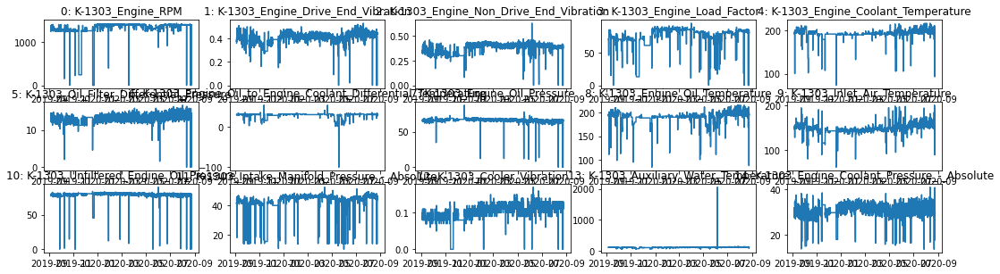

In [14]:
fig, axes = plt.subplots(12, 5, figsize=(18, 20))
for i, ax in enumerate(axes.ravel()):
    if i > 14:
        ax.set_visible(False)
        continue
    ax.plot(motor.iloc[:, i])
    ax.set_title("{}: {}".format(i, motor.columns[i]))

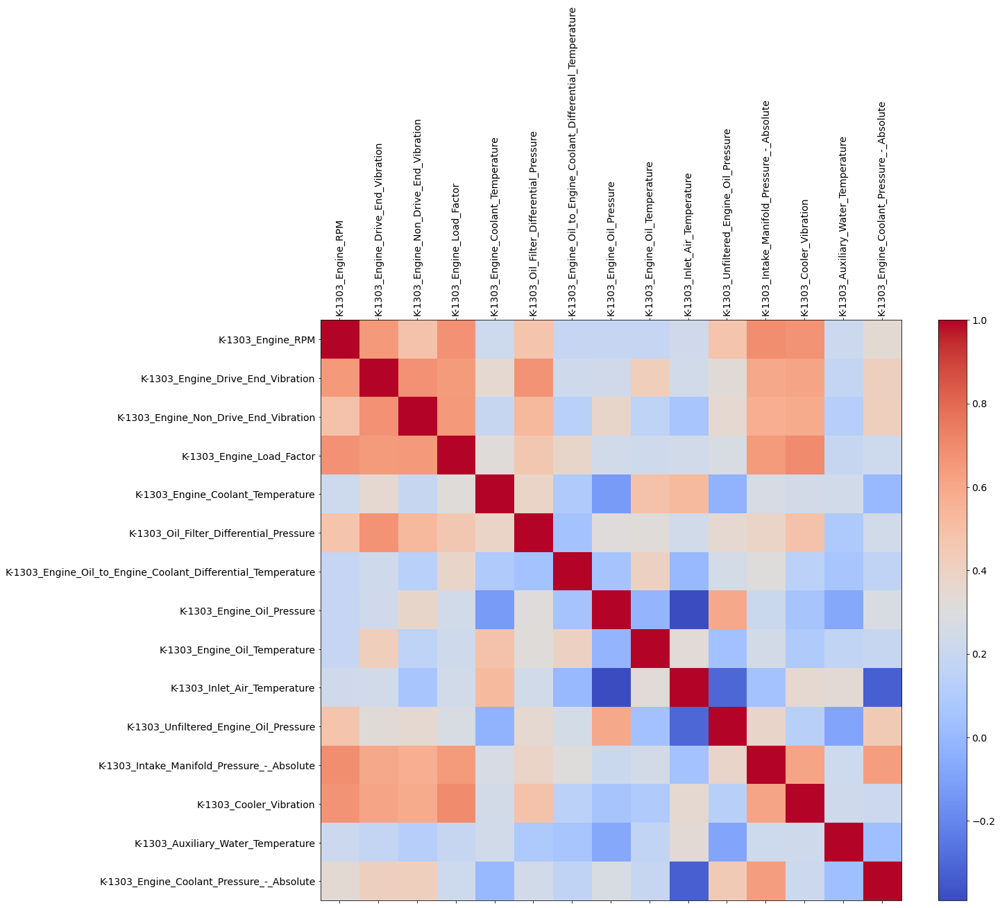

In [15]:
f = plt.figure(figsize=(19, 15))
plt.matshow(motor.corr(), fignum=f.number, cmap=plt.cm.coolwarm)
plt.xticks(range(motor.shape[1]), motor.columns, fontsize=14, rotation=90)
plt.yticks(range(motor.shape[1]), motor.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

# AutoML

In [20]:
from pycaret.anomaly import * 

C:\Users\ghopk\anaconda3\lib\site-packages\dask\dataframe\utils.py:369: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
C:\Users\ghopk\anaconda3\lib\site-packages\dask\dataframe\utils.py:369: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
C:\Users\ghopk\anaconda3\lib\site-packages\dask\dataframe\utils.py:369: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)


In [21]:
anom = setup(data = df, 
             silent = True)

,Description,Value
0,session_id,5312
1,Original Data,"(18361, 59)"
2,Missing Values,True
3,Numeric Features,59
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(18361, 59)"
9,CPU Jobs,-1


In [22]:
anom_model = create_model(model = 'iforest', fraction = 0.01)

In [23]:
results = assign_model(anom_model)

In [24]:
plot_model(anom_model, plot = 'tsne')

In [25]:
plot_model(anom_model, plot = 'umap')

In [26]:
res = results[['Anomaly', 'Anomaly_Score']]

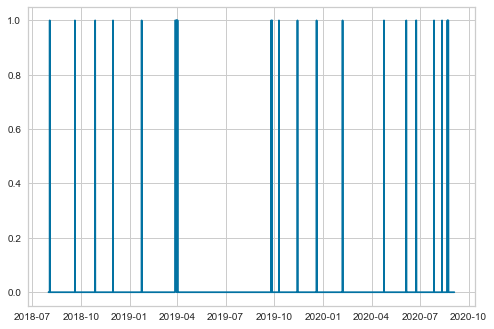

In [27]:
plt.plot(df.index, res['Anomaly'])

# K means

In [16]:
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA

In [17]:
sklearn.set_config(display='diagram')

In [18]:
simple = SimpleImputer()
standard = StandardScaler()
kmeans = KMeans(n_clusters=2)
pca = PCA()

In [19]:
pips = Pipeline([
    ('imputer', simple),
    ('scaler', standard),
    ('pca', pca),
    ('model', kmeans)
])
pips

Pipeline(steps=[('imputer', SimpleImputer()), ('scaler', StandardScaler()),
                ('pca', PCA()), ('model', KMeans(n_clusters=2))])